In [100]:
Pkg.status()

Status `~/McGill/projects/EVAL2-processing-surprisal/GitHub-processing-sampling/sampling-analysis/Project.toml`
  [336ed68f] CSV v0.10.9
⌃ [a93c6f00] DataFrames v1.4.1
⌃ [31c24e10] Distributions v0.25.76
⌃ [7073ff75] IJulia v1.23.3
  [b964fa9f] LaTeXStrings v1.3.0
⌃ [91a5bcdd] Plots v1.35.3
⌃ [6f49c342] RCall v0.13.13
  [f3b207a7] StatsPlots v0.15.4
Info Packages marked with ⌃ have new versions available and may be upgradable.


In [80]:
using StatsPlots, Distributions, Random, DataFrames, CSV

In [92]:
normalize(itr) = (sum(itr) == 1) ? itr : itr ./ sum(itr)

function guessWR_simulate(weights, target)
    u = copy(weights) # to avoid in-place modification
    p = normalize(u)
    steps, guess = 0, nothing
    while guess ≠ target
        steps += 1
        guess = rand(Categorical(p))
    end
    return steps
end

function guessWR_theoretical_runtime(weights, target)
    u = copy(weights) # to avoid in-place modification
    ptarget = normalize(u)[target]
    return (
        mean = 1 / ptarget, 
        variance = (1 - ptarget) / ptarget^2
    )
end


function guessWOR_simulate(weights, target)
    u = copy(weights) # to avoid in-place modification
    steps, guess = 0, nothing
    while guess ≠ target
        steps += 1
        if guess != nothing
            u[guess] = 0
        end
        p = normalize(u)
        guess = rand(Categorical(p))
    end
    return steps
end
function guessWOR_theoretical_runtime(weights, target)
    u0 = weights[target]
    u = weights[1:end .!= target]
    K = length(u)
    # P_i_0 = Pr(i \prec 0) = Pr(i|i0)
    P_i_0 = [u[i] / (u[i] + u0) for i=1:K]

    # P_i_j0 = Pr(i \prec (j\lor 0)) = Pr(i|ij0)
    P_i_j0 = [u[i] / (u[i] + u[j] + u0) for i=1:K, j=1:K]

    EXᵢs = P_i_0
    EXᵢXⱼs = [i==j ? P_i_0[i] : P_i_j0[i,j]*P_i_0[j] + P_i_j0[j,i]*P_i_0[i] for i=1:K, j=1:K]
    EXᵢEXⱼs = [P_i_0[i] * P_i_0[j] for i=1:K, j=1:K]

    # Equivalent way to calculate variance, which is more obviously represents derivation in paper:
    EXᵢXⱼs_iltj = [P_i_j0[i,j]*P_i_0[j] + P_i_j0[j,i]*P_i_0[i] for i=1:K, j=1:K if (i<j)]
    EXᵢEXⱼs_iltj = [P_i_0[i] * P_i_0[j] for i=1:K, j=1:K if (i<j)]
    variance_alt = sum(EXᵢs) - sum(EXᵢs .^ 2) + 2*sum(EXᵢXⱼs_iltj) - 2*sum(EXᵢEXⱼs_iltj)
    
    return (
        mean = 1 + sum(EXᵢs), 
        variance = sum(EXᵢXⱼs) - sum(EXᵢEXⱼs),
        # variance_alt = variance_alt
    )
end

"""
Make set of `M` samples equidistributed on inverse CDF of `dist`.
Optional arg `fixed_offset` ∈ (-0.5, 0.5) specidies fixed location within each bin.
If no fixed offset is specifed, offset be sampled once uniformly between -0.5 and 0.5. 
"""
function make_sample(dist, M = 100; fixed_offset = nothing)
    u = (fixed_offset === nothing) ? rand(Uniform(-0.5,0.5)) : fixed_offset
    if (u < -0.5) | (u > 0.5) @error "offset $(u) outside of range [-0.5,0.5]" end
    if (u == -0.5) | (u == 0.5) @warn "offset $(u) on boundary of range [-0.5,0.5]" end
    qs = ((0:M-1) .+ 0.5 .+ u) ./ M
    ws = quantile(dist, qs)
end

function make_simulation_data(;
        runtime_simulator = guess_WOR_simulate, 
        theoretical_runtime_calculator = guess_WOR_theoretical_runtime,
        get_weights = "sample", K = 501, 
        dist = Pareto(1,1), random_seed = 66)
    if get_weights == "sample"
        Random.seed!(random_seed)
        ws = rand(dist, K)
        # # to do odds as Pareto, rather than weights:
        # # need low theta value so the probs aren't all the same order of magnitude
        # ws = rand(Pareto(1,.001), K)
        # ws = ws ./ (ws .+ 1)
    elseif get_weights == "equidistributed_inv_CDF"
        ws = make_sample(dist, K)
    end

    theoretical = [theoretical_runtime_calculator(ws, i) for i in 1:length(ws)]

    all_simulated_runtimes = [[runtime_simulator(ws, i) for _ in 1:100] for i in 1:length(ws)]
    empirical = map(
            x->(mean_empirical = mean(x), variance_empirical = var(x)), 
            all_simulated_runtimes)

    WOR_df = hcat(
        DataFrame([ws, normalize(ws)], [:raw_weight, :normalized_weight]),
        rename(DataFrame(theoretical), :mean => :mean_theoretical, :variance => :variance_theoretical),
        rename(DataFrame(empirical)))
    
    sort(WOR_df, :raw_weight) 
end;

function make_WR_simulation_data(; args...) 
    make_simulation_data(
        runtime_simulator = guessWR_simulate, 
        theoretical_runtime_calculator = guessWR_theoretical_runtime;
        args...)
end;
function make_WOR_simulation_data(; args...) 
    make_simulation_data(
        runtime_simulator = guessWOR_simulate, 
        theoretical_runtime_calculator = guessWOR_theoretical_runtime;
        args...)
end;



function plot_df(d)
    fy_m = identity
    fy_v(v) = log(sqrt(v))
    fx(x) = -log(x)

    xs = fx.(d.normalized_weight)
    p1=plot(title="mean", legend=:topleft, ylab = "mean #samples")
    scatter!(p1, xs, fy_m.(d.mean_empirical), msw=0, alpha = 0.25, label = "empirical")
    scatter!(p1, xs, fy_m.(d.mean_theoretical),  shape=:+,  alpha = 0.5, label = "theoretical")
    p2=plot(title="variance (log standard deviation)", legend=:topleft, ylab = "log sd in #samples")
    scatter!(p2, xs, fy_v.(d.variance_empirical), msw=0, alpha = 0.25, label = "empirical")
    scatter!(p2, xs, fy_v.(d.variance_theoretical), shape=:+,  alpha = 0.5, label = "theoretical")
    plot(p1,p2, layout=[1,1])
end;


In [105]:
# Example:

# # Without replacement 
# plot_df(make_WOR_simulation_data(K = 201))
# plot_df(make_WOR_simulation_data(K = 201, get_weights = "equidistributed_inv_CDF"))

# # With replacement (takes longer of course!)
# plot_df(make_WR_simulation_data(K = 201))

## Plots for paper
Export data as csvs, and make actual plots with R (for visual consistency)

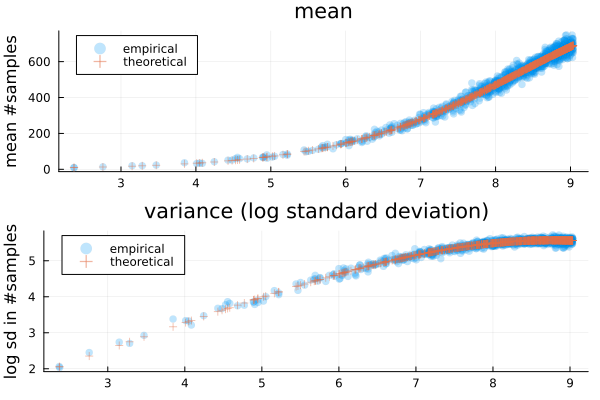

In [83]:
# Note! Takes about 4 minutes to complete.
df_WOR = make_WOR_simulation_data(K = 1001)
df_WOR |> CSV.write("plot_swor_runtime_df.csv")
plot_df(df_WOR)

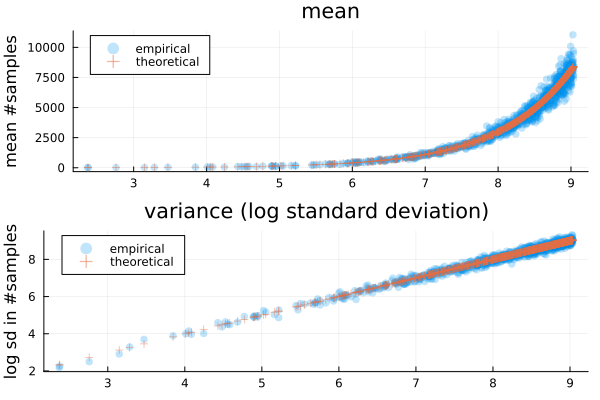

In [97]:
# Note! Takes about 25 minutes to complete.
df_WR = make_WR_simulation_data(K = 1001)
df_WR |> CSV.write("plot_swr_runtime_df.csv")
plot_df(df_WR)

Versions with points taken equidistant on inverse CDF rather than sampled

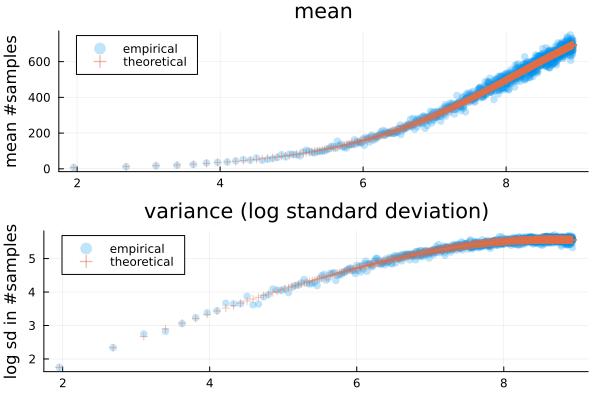

In [121]:
# Note! Takes about 4 minutes to complete.
Random.seed!(1)
df_WOR_eq = make_WOR_simulation_data(K = 1001, get_weights = "equidistributed_inv_CDF")
df_WOR_eq |> CSV.write("plot_swor_runtime_equidistant_df.csv")
plot_df(df_WOR_eq)

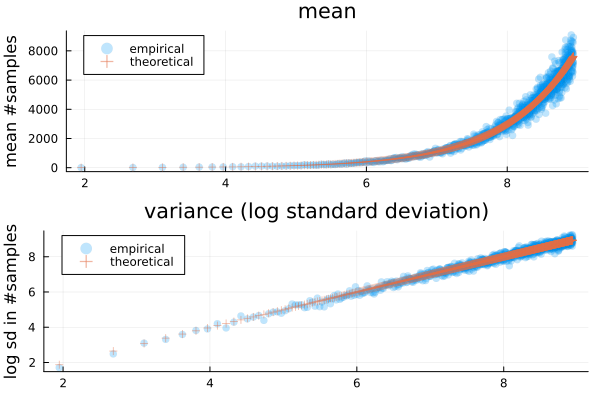

In [107]:
# Note! Takes about 25 minutes to complete.
Random.seed!(1)
df_WR_eq = make_WR_simulation_data(K = 1001, get_weights = "equidistributed_inv_CDF")
df_WR_eq |> CSV.write("plot_swr_runtime_equidistant_df.csv")
plot_df(df_WR_eq)